In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import requests
import json

import geopandas as gpd
import contextily as ctx

from PIL import Image
from io import BytesIO

In [6]:
with open('../data/api_keys.json', 'r') as file:
    keys = json.load(file)

maps_api_key = keys['Google']
geonames_username = keys['Geonames']

Persons - https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Person/f55k-p6yu/about_data  
Crashes - https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Crashes/h9gi-nx95/about_data

# Persons

In [7]:
persons = pd.read_csv('../data/raw/Motor_Vehicle_Collisions_-_Person_20240910.csv')
print(f'DF Shape: {persons.shape}')
display(persons.head())
display(persons.tail())

DF Shape: (5465905, 21)


,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,PERSON_ID,PERSON_TYPE,PERSON_INJURY,VEHICLE_ID,PERSON_AGE,EJECTION,...,BODILY_INJURY,POSITION_IN_VEHICLE,SAFETY_EQUIPMENT,PED_LOCATION,PED_ACTION,COMPLAINT,PED_ROLE,CONTRIBUTING_FACTOR_1,CONTRIBUTING_FACTOR_2,PERSON_SEX
0,10249006,4229554,10/26/2019,9:43,31aa2bc0-f545-444f-8cdb-f1cb5cf00b89,Occupant,Unspecified,19141108.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Registrant,NaN,NaN,U
1,10255054,4230587,10/25/2019,15:15,4629e500-a73e-48dc-b8fb-53124d124b80,Occupant,Unspecified,19144075.0,33.0,Not Ejected,...,Does Not Apply,"Front passenger, if two or more persons, inclu...",Lap Belt & Harness,NaN,NaN,Does Not Apply,Passenger,NaN,NaN,F
2,10253177,4230550,10/26/2019,17:55,ae48c136-1383-45db-83f4-2a5eecfb7cff,Occupant,Unspecified,19143133.0,55.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Registrant,NaN,NaN,M
3,6650180,3565527,11/21/2016,13:05,2782525,Occupant,Unspecified,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Notified Person,NaN,NaN,NaN
4,10255516,4231168,10/25/2019,11:16,e038e18f-40fb-4471-99cf-345eae36e064,Occupant,Unspecified,19144329.0,7.0,Not Ejected,...,Does Not Apply,Right rear passenger or motorcycle sidecar pas...,Lap Belt,NaN,NaN,Does Not Apply,Passenger,NaN,NaN,F


,UNIQUE_ID,COLLISION_ID,CRASH_DATE,CRASH_TIME,PERSON_ID,PERSON_TYPE,PERSON_INJURY,VEHICLE_ID,PERSON_AGE,EJECTION,...,BODILY_INJURY,POSITION_IN_VEHICLE,SAFETY_EQUIPMENT,PED_LOCATION,PED_ACTION,COMPLAINT,PED_ROLE,CONTRIBUTING_FACTOR_1,CONTRIBUTING_FACTOR_2,PERSON_SEX
5465900,13075922,4748879,08/15/2024,18:14,8fb8bae3-d103-4057-91d7-e1deb6df063a,Occupant,Unspecified,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Witness,NaN,NaN,NaN
5465901,13073491,4749474,08/20/2024,23:50,18e70cac-a19d-4532-b64a-8fc448b8407f,Occupant,Unspecified,20704654.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,Owner,NaN,NaN,NaN
5465902,13075758,4749928,08/20/2024,22:40,6f164e90-0d42-40be-9244-8a7575210bf0,Occupant,Unspecified,20705976.0,49.0,Not Ejected,...,Does Not Apply,Driver,Lap Belt & Harness,NaN,NaN,Does Not Apply,Driver,NaN,NaN,M
5465903,13075379,4749938,08/20/2024,18:54,68e9b4fa-a0ca-4e33-94b1-f0393279d457,Occupant,Unspecified,20705749.0,30.0,Not Ejected,...,Does Not Apply,Driver,NaN,NaN,NaN,Does Not Apply,Driver,NaN,NaN,M
5465904,13075212,4749660,08/20/2024,21:45,558d9481-23dd-4988-9f78-aec44a8d77b1,Occupant,Unspecified,20705644.0,69.0,Not Ejected,...,Does Not Apply,Driver,Lap Belt & Harness,NaN,NaN,Does Not Apply,Driver,NaN,NaN,M


In [8]:
persons.columns

Index(['UNIQUE_ID', 'COLLISION_ID', 'CRASH_DATE', 'CRASH_TIME', 'PERSON_ID',
       'PERSON_TYPE', 'PERSON_INJURY', 'VEHICLE_ID', 'PERSON_AGE', 'EJECTION',
       'EMOTIONAL_STATUS', 'BODILY_INJURY', 'POSITION_IN_VEHICLE',
       'SAFETY_EQUIPMENT', 'PED_LOCATION', 'PED_ACTION', 'COMPLAINT',
       'PED_ROLE', 'CONTRIBUTING_FACTOR_1', 'CONTRIBUTING_FACTOR_2',
       'PERSON_SEX'],
      dtype='object')

In [9]:
persons['CRASH_DATE'] = pd.to_datetime(persons['CRASH_DATE'])
persons['CRASH_TIME'] = pd.to_datetime(persons['CRASH_TIME']).dt.time

display(persons[['CRASH_DATE', 'CRASH_TIME']].head())

/var/folders/yd/dq0ds2hn6rs32t4__d98lrsc0000gn/T/ipykernel_8789/2670052160.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  persons['CRASH_TIME'] = pd.to_datetime(persons['CRASH_TIME']).dt.time


,CRASH_DATE,CRASH_TIME
0,2019-10-26,09:43:00
1,2019-10-25,15:15:00
2,2019-10-26,17:55:00
3,2016-11-21,13:05:00
4,2019-10-25,11:16:00


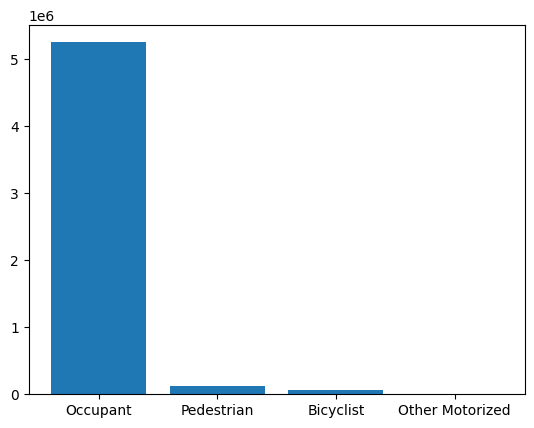

In [10]:
plt.figure()
plt.bar(persons['PERSON_TYPE'].value_counts().index, persons['PERSON_TYPE'].value_counts().values)
plt.show()

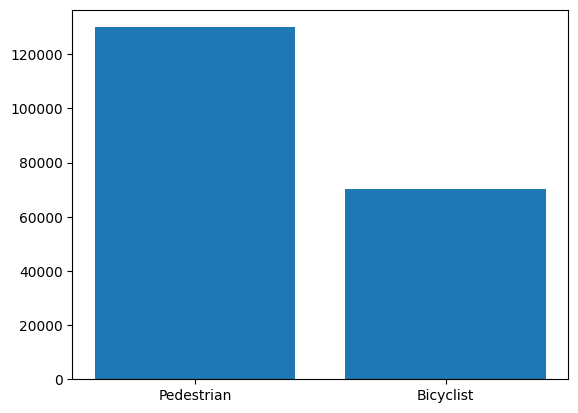

In [11]:
persons_only = persons[(persons['PERSON_TYPE'] != 'Occupant') & (persons['PERSON_TYPE'] != 'Other Motorized')]

plt.figure()
plt.bar(persons_only['PERSON_TYPE'].value_counts().index, persons_only['PERSON_TYPE'].value_counts().values)
plt.show()

/var/folders/yd/dq0ds2hn6rs32t4__d98lrsc0000gn/T/ipykernel_8789/552492355.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  persons_only['YEAR'] = pd.DatetimeIndex(persons_only['CRASH_DATE']).year


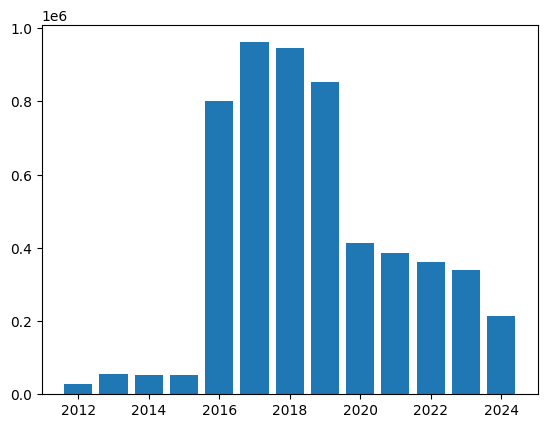

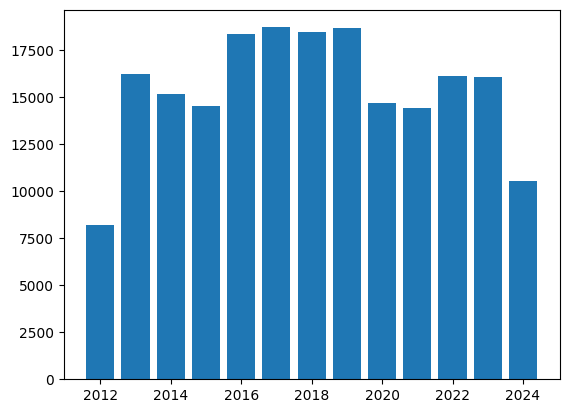

In [12]:
persons['YEAR'] = pd.DatetimeIndex(persons['CRASH_DATE']).year
persons_only['YEAR'] = pd.DatetimeIndex(persons_only['CRASH_DATE']).year

plt.figure()
plt.bar(persons['YEAR'].value_counts().index, persons['YEAR'].value_counts().values)
plt.show()

plt.figure()
plt.bar(persons_only['YEAR'].value_counts().index, persons_only['YEAR'].value_counts().values)
plt.show()

# Crashes

In [13]:
crashes = pd.read_csv('../data/raw/Motor_Vehicle_Collisions_-_Crashes_20240911.csv')
print(f'DF Shape: {crashes.shape}')
display(crashes.head())
display(crashes.tail())

/var/folders/yd/dq0ds2hn6rs32t4__d98lrsc0000gn/T/ipykernel_8789/1746341331.py:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  crashes = pd.read_csv('../data/raw/Motor_Vehicle_Collisions_-_Crashes_20240911.csv')


DF Shape: (2117343, 29)


,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
0,09/11/2021,2:39,NaN,NaN,NaN,NaN,NaN,WHITESTONE EXPRESSWAY,20 AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,4455765,Sedan,Sedan,NaN,NaN,NaN
1,03/26/2022,11:45,NaN,NaN,NaN,NaN,NaN,QUEENSBORO BRIDGE UPPER,NaN,NaN,...,NaN,NaN,NaN,NaN,4513547,Sedan,NaN,NaN,NaN,NaN
2,06/29/2022,6:55,NaN,NaN,NaN,NaN,NaN,THROGS NECK BRIDGE,NaN,NaN,...,Unspecified,NaN,NaN,NaN,4541903,Sedan,Pick-up Truck,NaN,NaN,NaN
3,09/11/2021,9:35,BROOKLYN,11208.0,40.667202,-73.866500,"(40.667202, -73.8665)",NaN,NaN,1211 LORING AVENUE,...,NaN,NaN,NaN,NaN,4456314,Sedan,NaN,NaN,NaN,NaN
4,12/14/2021,8:13,BROOKLYN,11233.0,40.683304,-73.917274,"(40.683304, -73.917274)",SARATOGA AVENUE,DECATUR STREET,NaN,...,NaN,NaN,NaN,NaN,4486609,NaN,NaN,NaN,NaN,NaN


,CRASH DATE,CRASH TIME,BOROUGH,ZIP CODE,LATITUDE,LONGITUDE,LOCATION,ON STREET NAME,CROSS STREET NAME,OFF STREET NAME,...,CONTRIBUTING FACTOR VEHICLE 2,CONTRIBUTING FACTOR VEHICLE 3,CONTRIBUTING FACTOR VEHICLE 4,CONTRIBUTING FACTOR VEHICLE 5,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,VEHICLE TYPE CODE 3,VEHICLE TYPE CODE 4,VEHICLE TYPE CODE 5
2117338,08/20/2024,15:18,BROOKLYN,11212.0,NaN,NaN,NaN,NaN,NaN,44 NEW LOTS AVENUE,...,Unspecified,NaN,NaN,NaN,4750415,Sedan,Box Truck,NaN,NaN,NaN
2117339,08/21/2024,8:50,BRONX,10475.0,NaN,NaN,NaN,NaN,NaN,2035 BARTOW AVENUE,...,Unspecified,NaN,NaN,NaN,4750338,Sedan,Station Wagon/Sport Utility Vehicle,NaN,NaN,NaN
2117340,08/21/2024,20:10,QUEENS,11103.0,NaN,NaN,NaN,BROADWAY,NEWTOWN ROAD,NaN,...,Unspecified,NaN,NaN,NaN,4750194,Station Wagon/Sport Utility Vehicle,Moped,NaN,NaN,NaN
2117341,08/21/2024,12:58,BRONX,10462.0,NaN,NaN,NaN,WHITE PLAINS ROAD,WOOD AVENUE,NaN,...,Unspecified,NaN,NaN,NaN,4750059,Bike,Sedan,NaN,NaN,NaN
2117342,08/21/2024,6:23,QUEENS,11102.0,NaN,NaN,NaN,30 AVENUE,31 STREET,NaN,...,NaN,NaN,NaN,NaN,4749876,Sedan,NaN,NaN,NaN,NaN


In [14]:
crashes.columns

Index(['CRASH DATE', 'CRASH TIME', 'BOROUGH', 'ZIP CODE', 'LATITUDE',
       'LONGITUDE', 'LOCATION', 'ON STREET NAME', 'CROSS STREET NAME',
       'OFF STREET NAME', 'NUMBER OF PERSONS INJURED',
       'NUMBER OF PERSONS KILLED', 'NUMBER OF PEDESTRIANS INJURED',
       'NUMBER OF PEDESTRIANS KILLED', 'NUMBER OF CYCLIST INJURED',
       'NUMBER OF CYCLIST KILLED', 'NUMBER OF MOTORIST INJURED',
       'NUMBER OF MOTORIST KILLED', 'CONTRIBUTING FACTOR VEHICLE 1',
       'CONTRIBUTING FACTOR VEHICLE 2', 'CONTRIBUTING FACTOR VEHICLE 3',
       'CONTRIBUTING FACTOR VEHICLE 4', 'CONTRIBUTING FACTOR VEHICLE 5',
       'COLLISION_ID', 'VEHICLE TYPE CODE 1', 'VEHICLE TYPE CODE 2',
       'VEHICLE TYPE CODE 3', 'VEHICLE TYPE CODE 4', 'VEHICLE TYPE CODE 5'],
      dtype='object')

# Join

In [15]:
persons = pd.merge(left=persons, right=crashes, left_on='COLLISION_ID', right_on='COLLISION_ID', how='inner')
persons.shape
persons.head

<bound method NDFrame.head of          UNIQUE_ID  COLLISION_ID CRASH_DATE CRASH_TIME  \
0         10249006       4229554 2019-10-26   09:43:00   
1         10255054       4230587 2019-10-25   15:15:00   
2         10253177       4230550 2019-10-26   17:55:00   
3          6650180       3565527 2016-11-21   13:05:00   
4         10255516       4231168 2019-10-25   11:16:00   
...            ...           ...        ...        ...   
5465900   13075922       4748879 2024-08-15   18:14:00   
5465901   13073491       4749474 2024-08-20   23:50:00   
5465902   13075758       4749928 2024-08-20   22:40:00   
5465903   13075379       4749938 2024-08-20   18:54:00   
5465904   13075212       4749660 2024-08-20   21:45:00   

                                    PERSON_ID PERSON_TYPE PERSON_INJURY  \
0        31aa2bc0-f545-444f-8cdb-f1cb5cf00b89    Occupant   Unspecified   
1        4629e500-a73e-48dc-b8fb-53124d124b80    Occupant   Unspecified   
2        ae48c136-1383-45db-83f4-2a5eecfb7cff   

In [16]:
persons_only = pd.merge(left=persons_only, right=crashes, left_on='COLLISION_ID', right_on='COLLISION_ID', how='inner')
persons_only.shape

(200220, 50)

In [17]:
persons_only.columns

Index(['UNIQUE_ID', 'COLLISION_ID', 'CRASH_DATE', 'CRASH_TIME', 'PERSON_ID',
       'PERSON_TYPE', 'PERSON_INJURY', 'VEHICLE_ID', 'PERSON_AGE', 'EJECTION',
       'EMOTIONAL_STATUS', 'BODILY_INJURY', 'POSITION_IN_VEHICLE',
       'SAFETY_EQUIPMENT', 'PED_LOCATION', 'PED_ACTION', 'COMPLAINT',
       'PED_ROLE', 'CONTRIBUTING_FACTOR_1', 'CONTRIBUTING_FACTOR_2',
       'PERSON_SEX', 'YEAR', 'CRASH DATE', 'CRASH TIME', 'BOROUGH', 'ZIP CODE',
       'LATITUDE', 'LONGITUDE', 'LOCATION', 'ON STREET NAME',
       'CROSS STREET NAME', 'OFF STREET NAME', 'NUMBER OF PERSONS INJURED',
       'NUMBER OF PERSONS KILLED', 'NUMBER OF PEDESTRIANS INJURED',
       'NUMBER OF PEDESTRIANS KILLED', 'NUMBER OF CYCLIST INJURED',
       'NUMBER OF CYCLIST KILLED', 'NUMBER OF MOTORIST INJURED',
       'NUMBER OF MOTORIST KILLED', 'CONTRIBUTING FACTOR VEHICLE 1',
       'CONTRIBUTING FACTOR VEHICLE 2', 'CONTRIBUTING FACTOR VEHICLE 3',
       'CONTRIBUTING FACTOR VEHICLE 4', 'CONTRIBUTING FACTOR VEHICLE 5',
    

In [18]:
print(
    f'Original DF Shape: {persons.shape}\n'
    f'Shape w/out NaN for LOCATION: {persons.dropna(subset="LOCATION").shape}\n'
    f'Shape w/out zero for LONGITUDE: {persons[persons["LONGITUDE"] != 0].shape}\n'
    f'Shape w/out NaN or zero for LOCATION: {persons[(persons["LONGITUDE"] != 0) & (persons["LOCATION"].notna())].shape}'
)

Original DF Shape: (5465905, 50)
Shape w/out NaN for LOCATION: (4914994, 50)
Shape w/out zero for LONGITUDE: (5449435, 50)
Shape w/out NaN or zero for LOCATION: (4898524, 50)


In [19]:
persons = persons.dropna(subset='LOCATION').reset_index(drop=True)
persons = persons[persons['LONGITUDE'] != 0].reset_index(drop=True)

persons_only = persons_only.dropna(subset='LOCATION').reset_index(drop=True)
persons_only = persons_only[persons_only['LONGITUDE'] != 0].reset_index(drop=True)

print(
    f'Updated DF Shape for persons: {persons.shape}'
    f'\nUpdated DF Shape for persons_only: {persons_only.shape}'
)

Updated DF Shape for persons: (4898524, 50)
Updated DF Shape for persons_only: (183762, 50)


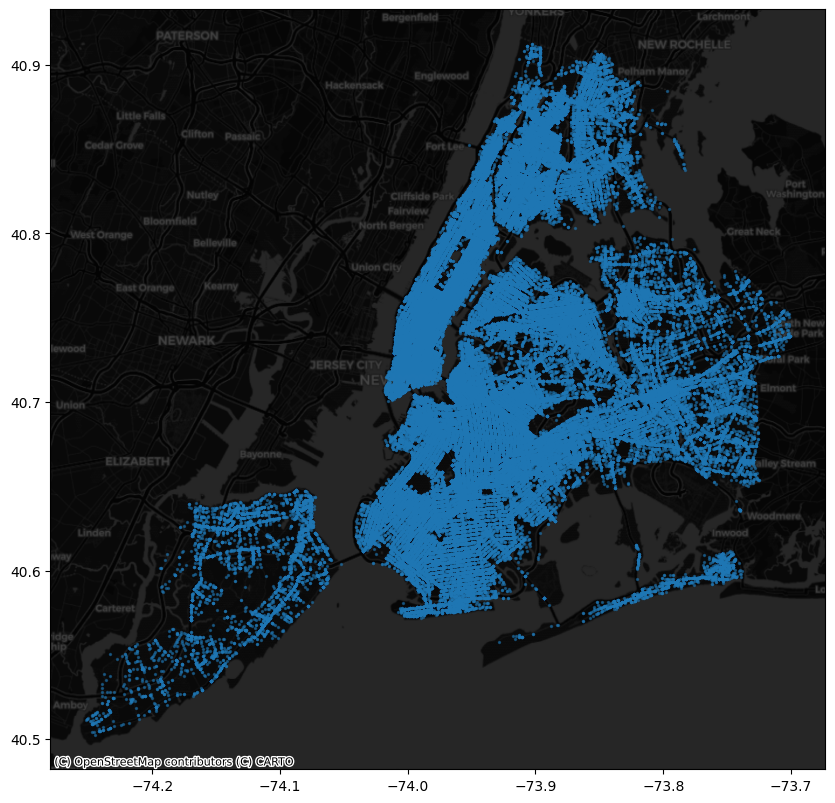

In [20]:
gdf = gpd.GeoDataFrame(
    persons_only, crs="EPSG:4326",
    geometry=gpd.points_from_xy(persons_only.LONGITUDE, persons_only.LATITUDE)
)

# Plot the points on a map
ax = gdf.plot(figsize=(10, 10), alpha=0.5, markersize=2)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatter, crs=gdf.crs.to_string())

plt.show()

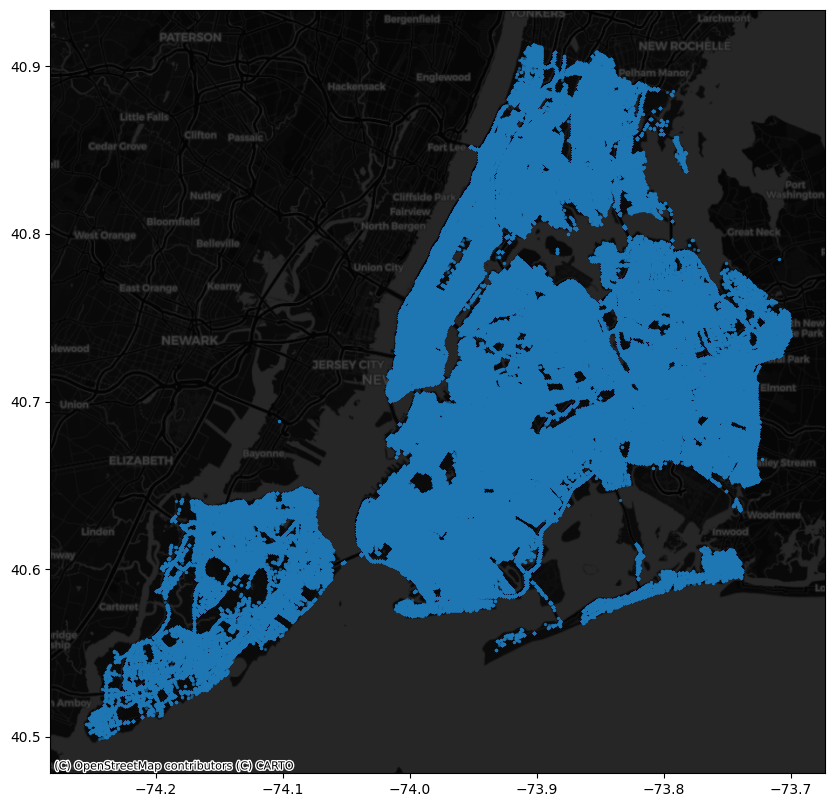

In [21]:
df = persons[
    (persons['LATITUDE'] >= 40.4774) & (persons['LATITUDE'] <= 40.9176) &
    (persons['LONGITUDE'] >= -74.2591) & (persons['LONGITUDE'] <= -73.7002)
]

gdf = gpd.GeoDataFrame(
    df, crs="EPSG:4326",
    geometry=gpd.points_from_xy(df.LONGITUDE, df.LATITUDE)
)

# Plot the points on a map
ax = gdf.plot(figsize=(10, 10), alpha=0.5, markersize=2)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatter, crs=gdf.crs.to_string())

plt.show()

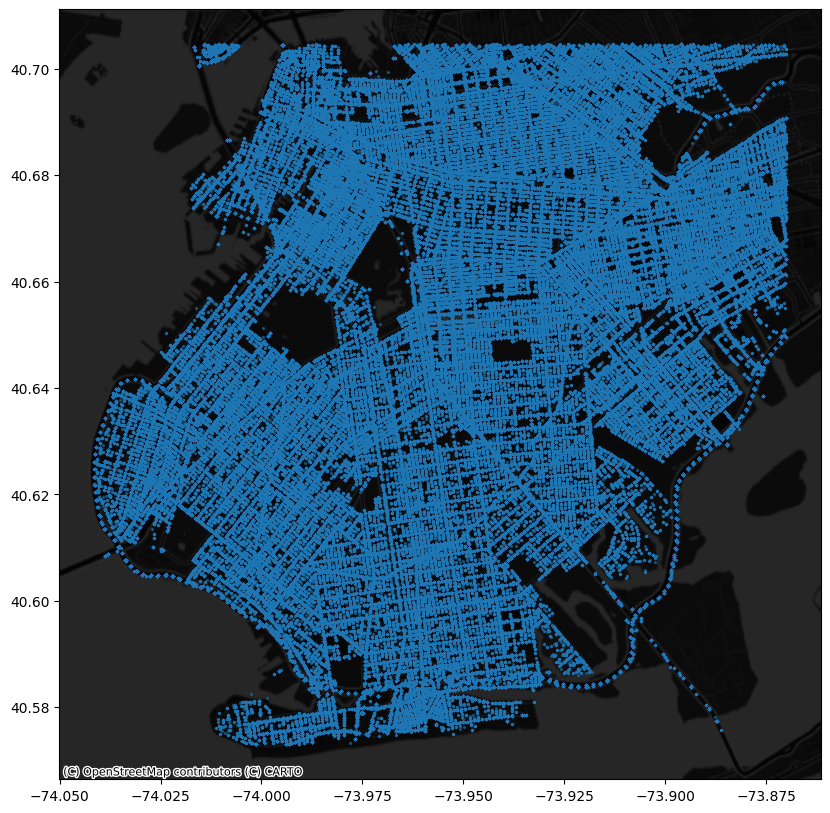

In [22]:
df = df[
    (df['LATITUDE'] >= 40.5730) & (df['LATITUDE'] <= 40.7046) &
    (df['LONGITUDE'] >= -74.0419) & (df['LONGITUDE'] <= -73.8700)
]

gdf = gpd.GeoDataFrame(
    df, crs="EPSG:4326",
    geometry=gpd.points_from_xy(df.LONGITUDE, df.LATITUDE)
)

# Plot the points on a map
ax = gdf.plot(figsize=(10, 10), alpha=0.5, markersize=2)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatter, crs=gdf.crs.to_string())

plt.show()

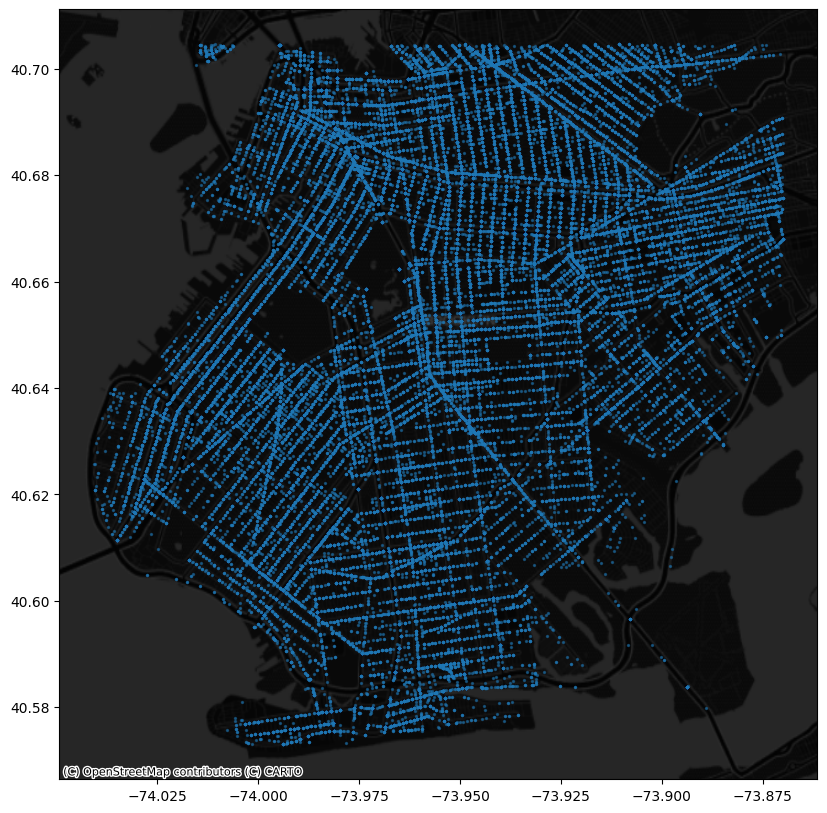

In [23]:
df = persons_only[
    (persons_only['LATITUDE'] >= 40.5730) & (persons_only['LATITUDE'] <= 40.7046) &
    (persons_only['LONGITUDE'] >= -74.0419) & (persons_only['LONGITUDE'] <= -73.8700)
]

gdf = gpd.GeoDataFrame(
    df, crs="EPSG:4326",
    geometry=gpd.points_from_xy(df.LONGITUDE, df.LATITUDE)
)

# Plot the points on a map
ax = gdf.plot(figsize=(10, 10), alpha=0.5, markersize=2)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatter, crs=gdf.crs.to_string())

plt.show()

# Unique locations

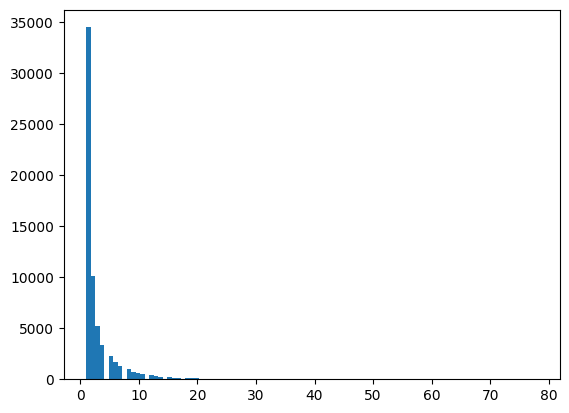

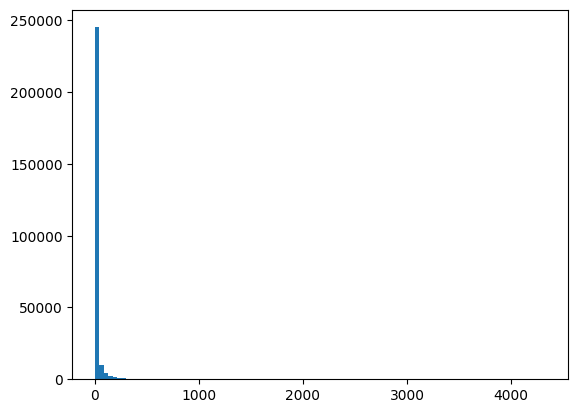

In [24]:
plt.figure()
plt.hist(persons_only[persons_only['LATITUDE'] != 0].LOCATION.value_counts(), bins=100)
plt.show()

plt.figure()
plt.hist(persons[persons['LATITUDE'] != 0].LOCATION.value_counts(), bins=100)
plt.show()

In [25]:
print(
    f'Unique locations persons only: {persons_only[persons_only["LATITUDE"] != 0]["LOCATION"].nunique()}'
    f'\nUnique locations all collisions: {persons[persons["LATITUDE"] != 0]["LOCATION"].nunique()}'
)

Unique locations persons only: 63615
Unique locations all collisions: 267373


# Export

In [26]:
persons.to_csv('../data/processed/collisions_all.csv', index=False)
persons_only.to_csv('../data/processed/collisions_ped_cyc.csv', index=False)

# Sample Images

In [27]:
def get_satellite_image(lat, lon, zoom=20, size="640x640", map_type="satellite", api_key=maps_api_key):
    base_url = "https://maps.googleapis.com/maps/api/staticmap"
    params = {
        "center": f"{lat},{lon}",
        "zoom": zoom,
        "size": size,
        "maptype": map_type,
        "key": api_key
    }
    response = requests.get(base_url, params=params)
    image = Image.open(BytesIO(response.content))
    return image

def check_for_intersection(coords, distance_threshold=0.02, api_key=geonames_username):
    url = f"http://api.geonames.org/findNearestIntersectionJSON?lat={coords[0]}&lng={coords[1]}&username={api_key}"
    response = requests.get(url)
    if response.status_code == 200:
        data = response.json()
        if 'intersection' in data:
            if float(data['intersection']['distance']) <= distance_threshold:
                return coords[0], coords[1], True, data['intersection']
            else:
                return coords[0], coords[1], False, data['intersection']
    return coords[0], coords[1], False, None

91 STREET                        & 31 AVENUE
Coords: 40.760113, -73.87768
Distance: 0 -- Result: True


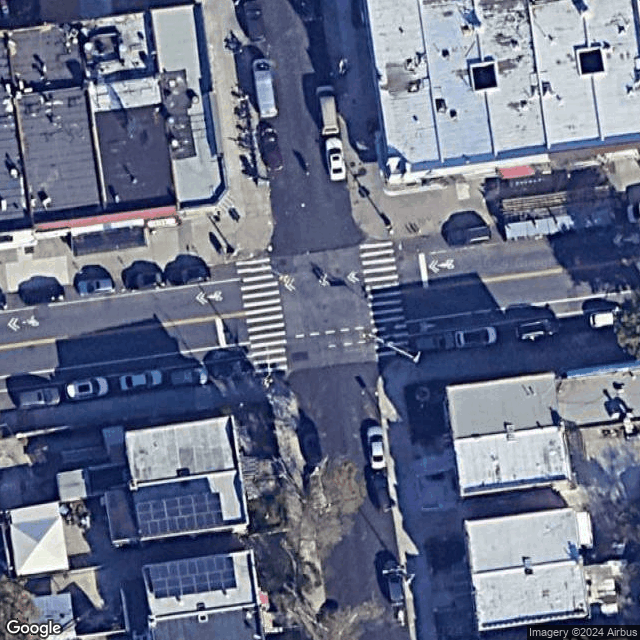

In [28]:
record = persons_only.iloc[310]
coords = (record.LATITUDE, record.LONGITUDE)
lat, lng, result, data = check_for_intersection(coords)
print(f"{record['ON STREET NAME']} & {record['CROSS STREET NAME']}\nCoords: {lat}, {lng}")
if data:
    print(f'Distance: {data["distance"]} -- Result: {result}')
img = get_satellite_image(record.LATITUDE, record.LONGITUDE)
display(img)

In [29]:
result = check_for_intersection(coords)
results = [result, result]
pd.DataFrame(results, columns=['lat', 'lng', 'intersection', 'data'])

,lat,lng,intersection,data
0,40.760113,-73.87768,True,"{'mtfcc1': 'S1400', 'mtfcc2': 'S1400', 'adminC..."
1,40.760113,-73.87768,True,"{'mtfcc1': 'S1400', 'mtfcc2': 'S1400', 'adminC..."


nan & nan
Coords: 40.690037, -73.9515
Distance: 0.02 -- Result: True


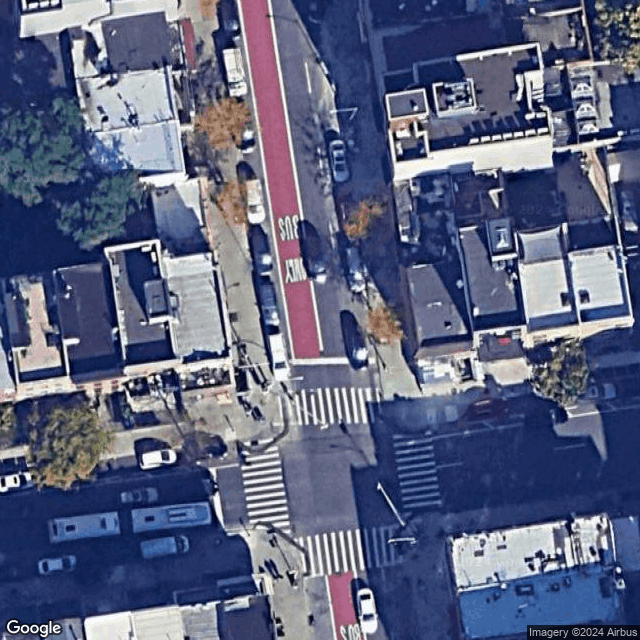

CONEY ISLAND AVENUE              & AVENUE O                        
Coords: 40.6125498, -73.962859
Distance: 0 -- Result: True


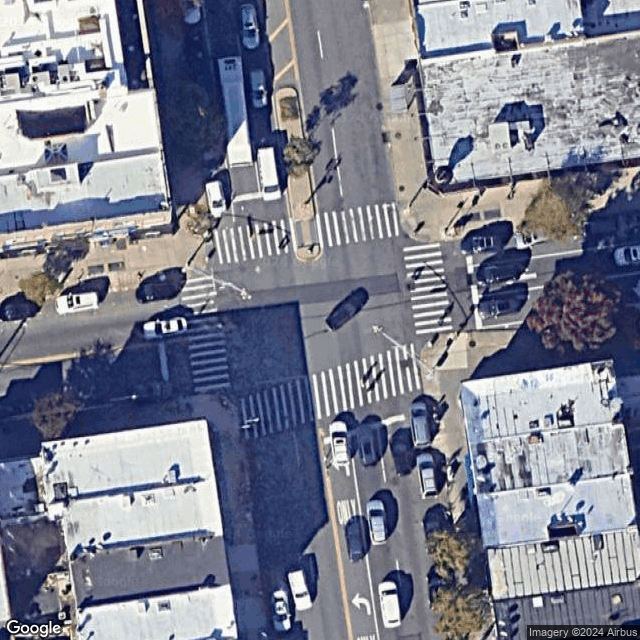

DAVIDSON AVENUE                  & WEST 192 STREET
Coords: 40.865997, -73.89981
Distance: 0 -- Result: True


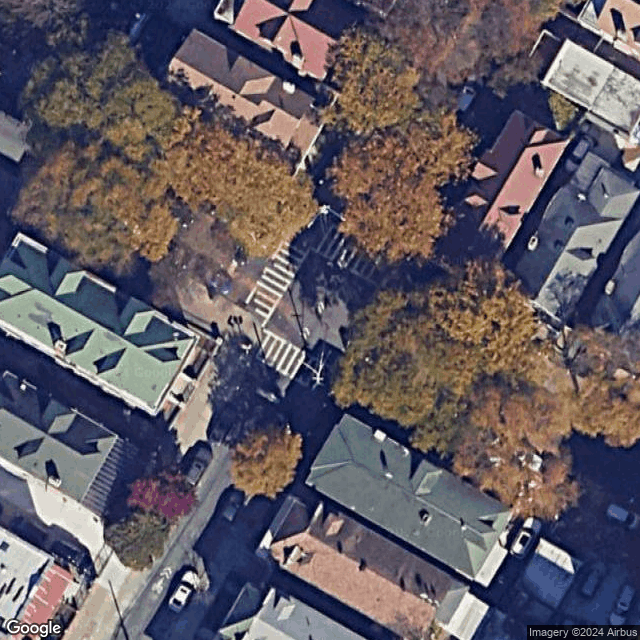

WYTHE AVENUE                     & NORTH 4 STREET
Coords: 40.71786, -73.96223
Distance: 0 -- Result: True


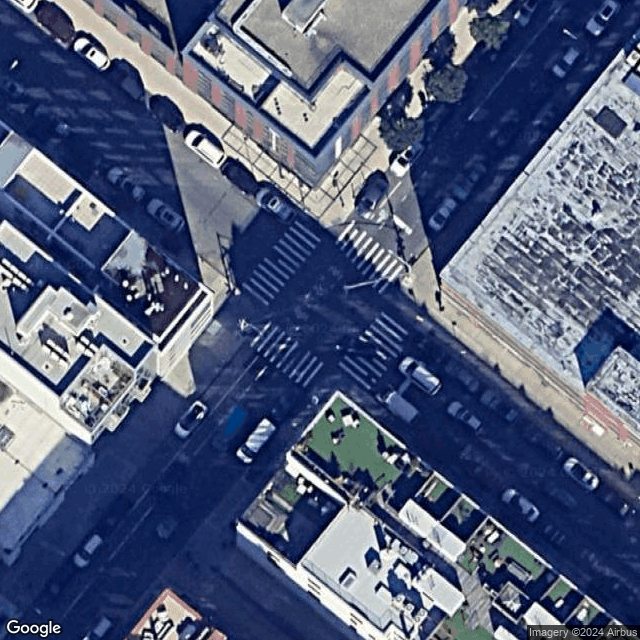

1 AVENUE                         & EAST 45 STREET
Coords: 40.75076, -73.96843
Distance: 0 -- Result: True


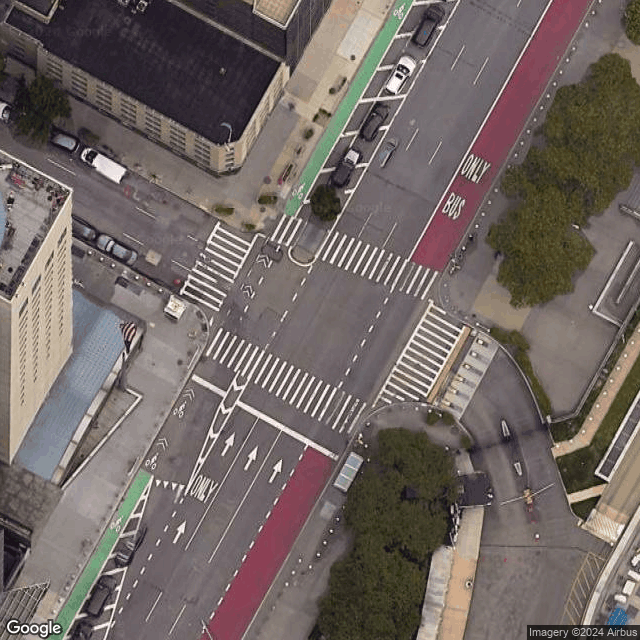

nan & nan
Coords: 40.824524, -73.85895
Distance: 0.04 -- Result: False


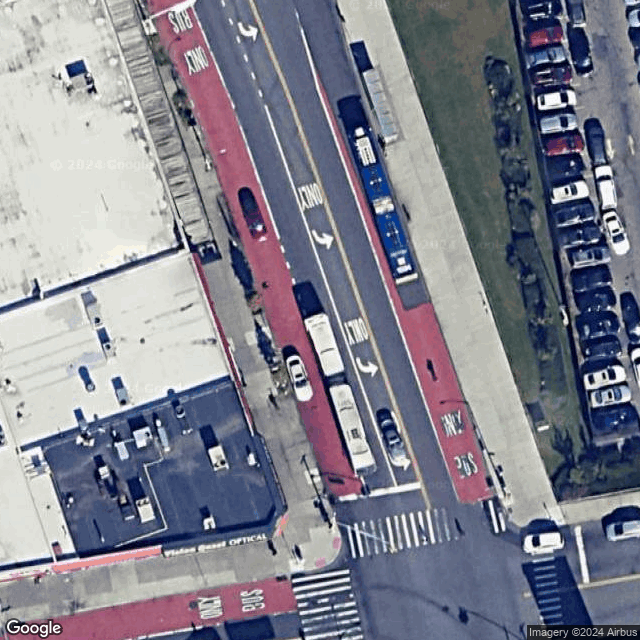

KINGS HIGHWAY                    & EAST 94 STREET                  
Coords: 40.6580097, -73.9207657
Distance: 0 -- Result: True


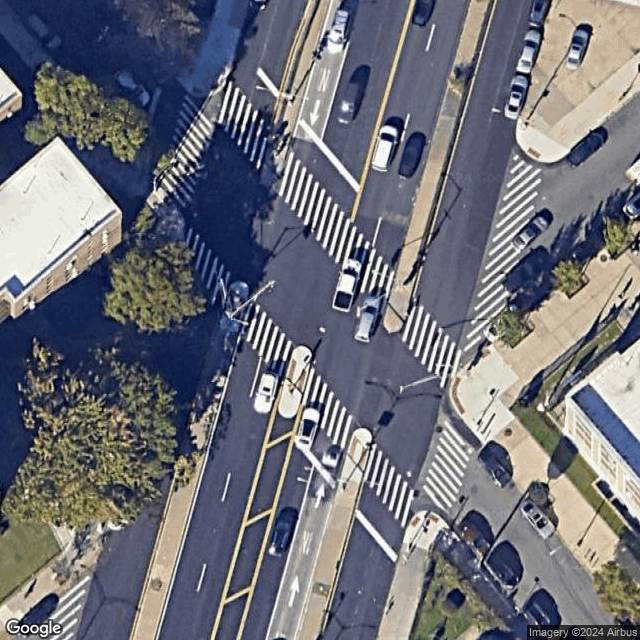

NORTHERN BOULEVARD               & 38 STREET                       
Coords: 40.7521364, -73.9256273
Distance: 0 -- Result: True


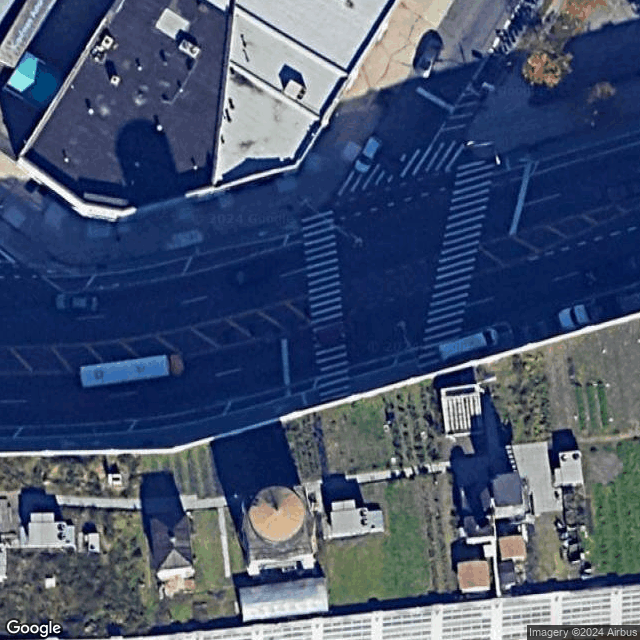

nan & nan
Coords: 40.870186, -73.91545
Distance: 0.04 -- Result: False


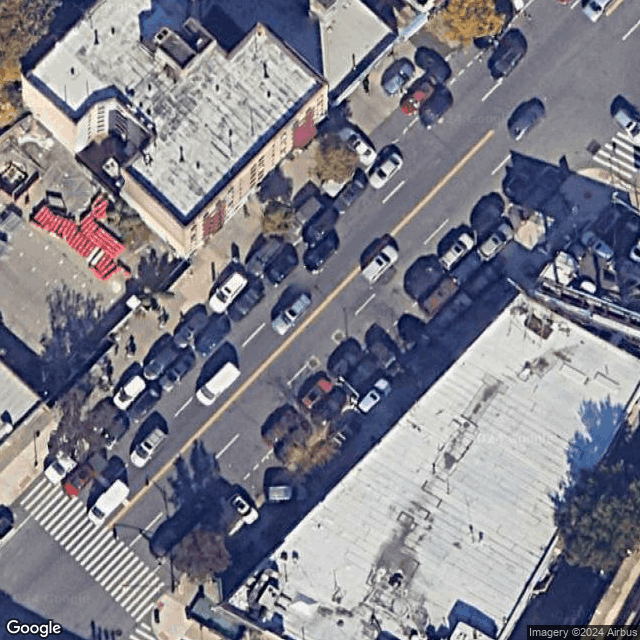

BEACH 94 STREET                  & ROCKAWAY FREEWAY                
Coords: 40.5867024, -73.8170309
Distance: 0.01 -- Result: True


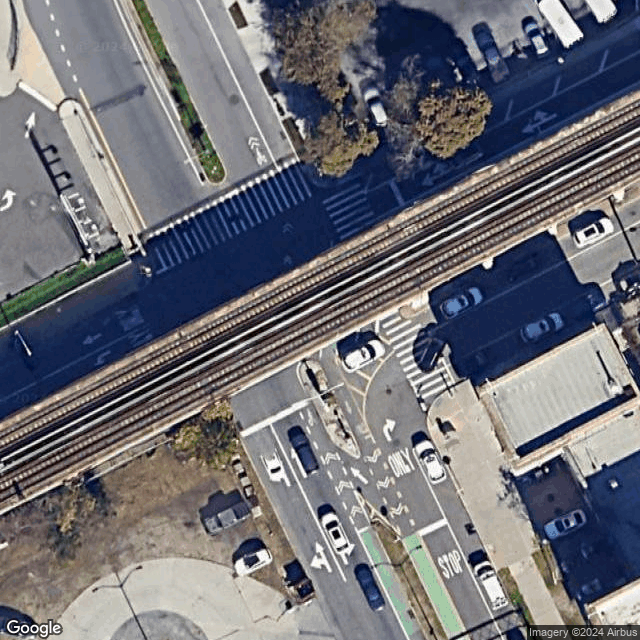

CHRYSTIE STREET                  & DELANCEY STREET                 
Coords: 40.7199725, -73.9928968
Distance: 0.01 -- Result: True


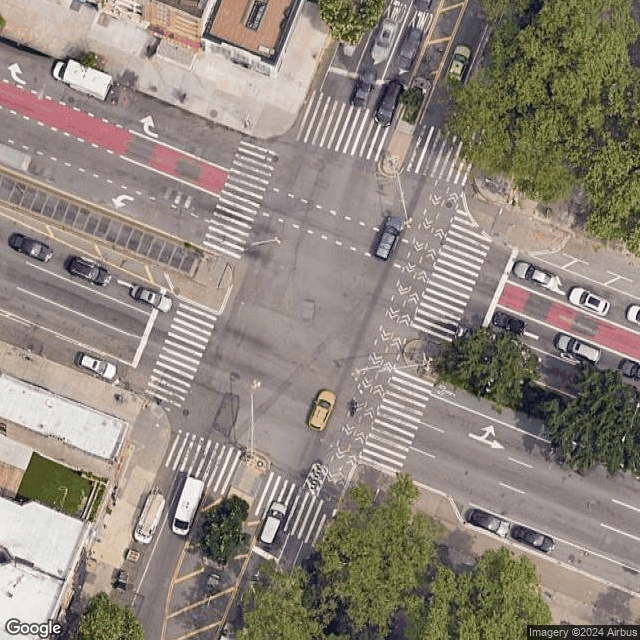

COLUMBUS AVENUE                  & WEST 97 STREET
Coords: 40.79356, -73.96702
Distance: 0 -- Result: True


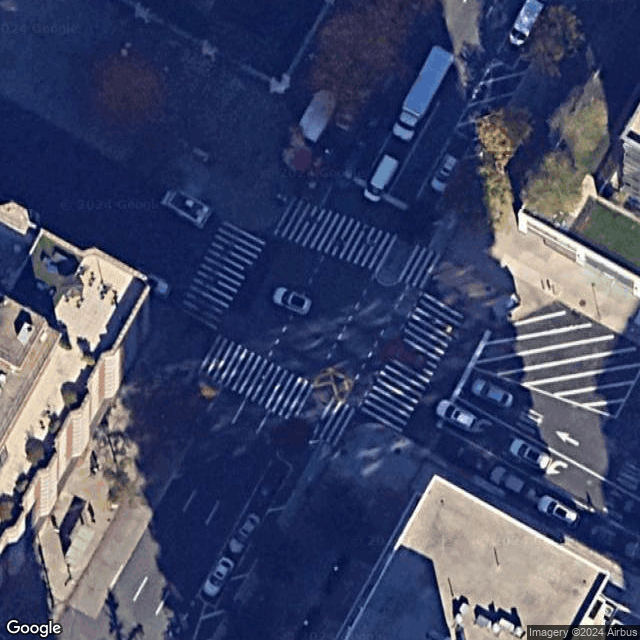

MORRIS AVENUE                    & EAST 144 STREET                 
Coords: 40.8154399, -73.9239995
Distance: 0 -- Result: True


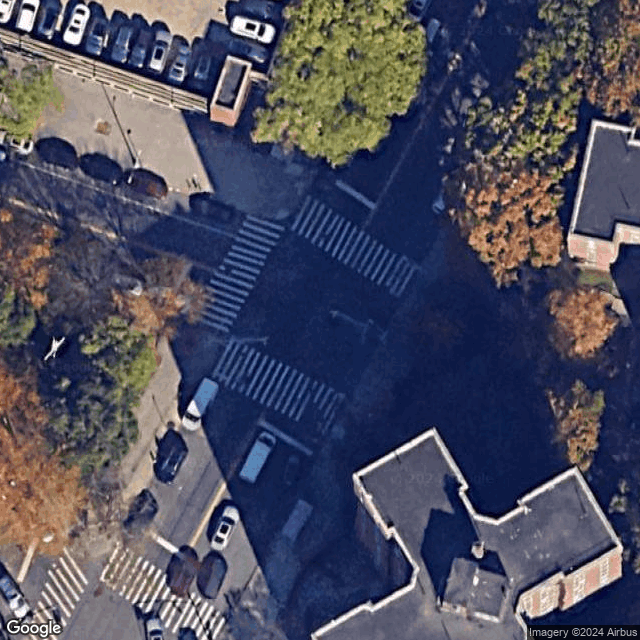

34 AVENUE                        & 89 STREET                       
Coords: 40.7544157, -73.8785293
Distance: 0 -- Result: True


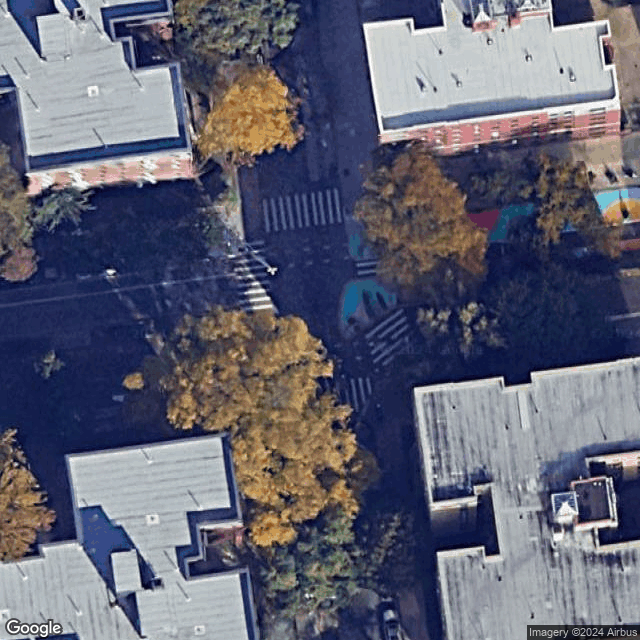

EAST 28 STREET                   & PARK AVENUE SOUTH
Coords: 40.743324, -73.984085
Distance: 0 -- Result: True


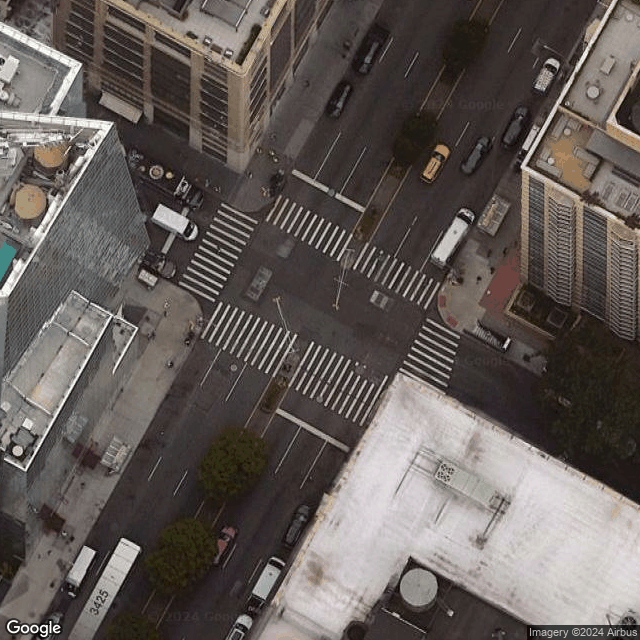

WEST 40 STREET                   & 8 AVENUE                        
Coords: 40.7559505, -73.9907272
Distance: 0 -- Result: True


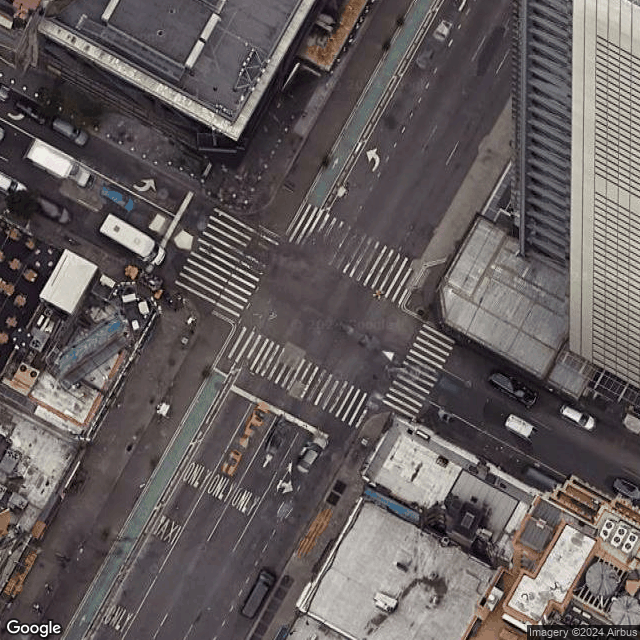

BAY PARKWAY                      & 84 STREET                       
Coords: 40.6030888, -73.9926175
Distance: 0 -- Result: True


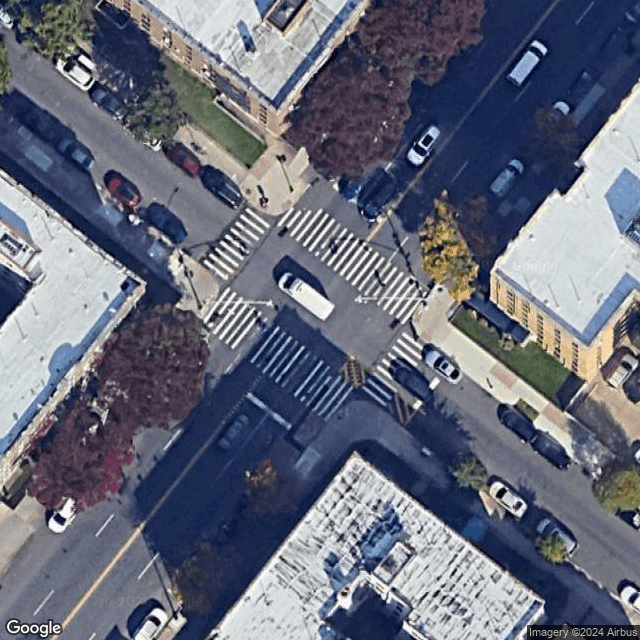

BROADWAY                         & ELLERY STREET
Coords: 40.699455, -73.9397
Distance: 0 -- Result: True


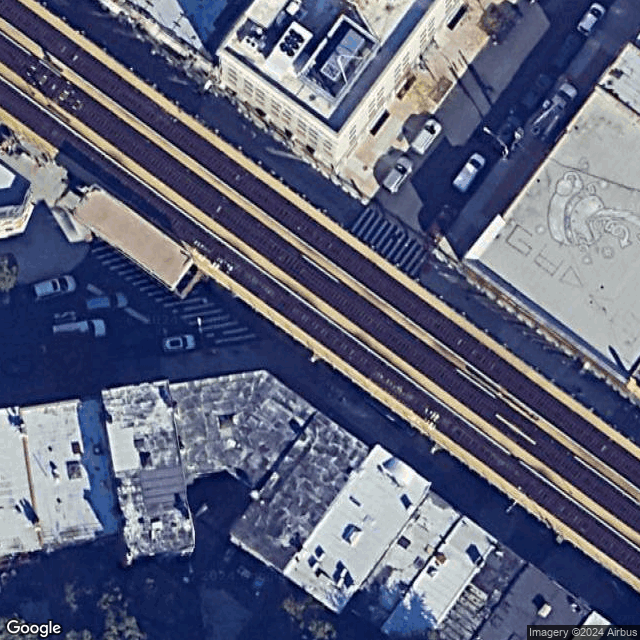

nan & nan
Coords: 40.81905, -73.92708
Distance: 0.05 -- Result: False


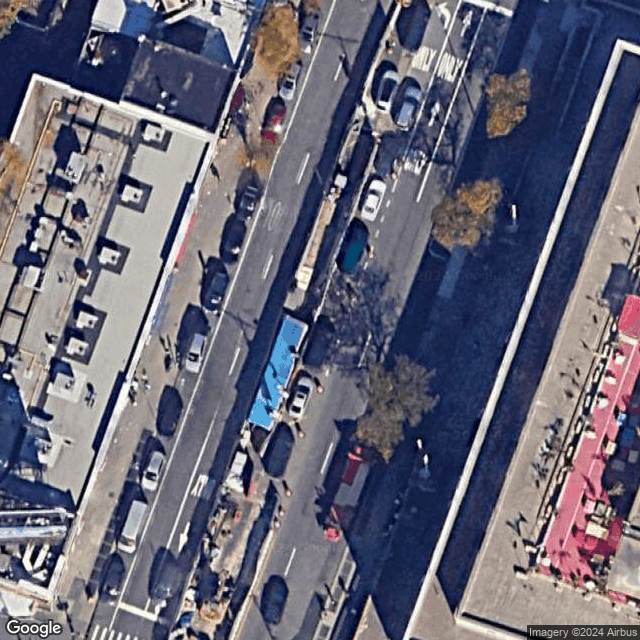

nan & nan
Coords: 40.604317, -73.81987
Distance: 0.01 -- Result: True


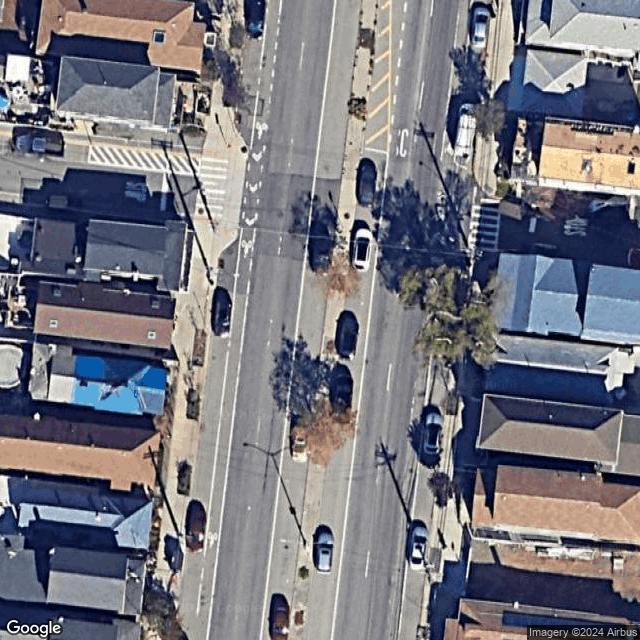

In [30]:
for i in range(40000,40020):
    record = persons_only.iloc[i]
    coords = (record.LATITUDE, record.LONGITUDE)
    lat, lng, result, data = check_for_intersection(coords)
    print(f"{record['ON STREET NAME']} & {record['CROSS STREET NAME']}\nCoords: {lat}, {lng}")
    if data:
        print(f'Distance: {data["distance"]} -- Result: {result}')
    img = get_satellite_image(record.LATITUDE, record.LONGITUDE)
    display(img)

# Intersection Flags

In [31]:
api_key = geonames_username
coords = (40.760113, -73.87768)
url = f"http://api.geonames.org/findNearestIntersectionJSON?lat={coords[0]}&lng={coords[1]}&username={api_key}"
response = requests.get(url)
response.status_code
response.json()

{'credits': '1.0',
 'intersection': {'mtfcc1': 'S1400',
  'mtfcc2': 'S1400',
  'adminCode1': 'NY',
  'lng': '-73.877668',
  'distance': '0',
  'bearing': '83',
  'placename': 'New York',
  'street1Bearing': '81',
  'street2Bearing': '172',
  'adminName2': 'Queens',
  'postalcode': '11369',
  'countryCode': 'US',
  'street1': '31st Ave',
  'street2': '91st St',
  'adminName1': 'New York',
  'lat': '40.760114'}}

In [41]:
api_key = geonames_username
coords = (40.760113, -73.87768)
url = f"http://api.geonames.org/findNearestIntersectionJSON?lat={coords[0]}&lng={coords[1]}&username={api_key}"
response = requests.get(url)
response.status_code
response.json()

{'credits': '1.0',
 'intersection': {'mtfcc1': 'S1400',
  'mtfcc2': 'S1400',
  'adminCode1': 'NY',
  'lng': '-73.877668',
  'distance': '0',
  'bearing': '83',
  'placename': 'New York',
  'street1Bearing': '81',
  'street2Bearing': '172',
  'adminName2': 'Queens',
  'postalcode': '11369',
  'countryCode': 'US',
  'street1': '31st Ave',
  'street2': '91st St',
  'adminName1': 'New York',
  'lat': '40.760114'}}

In [42]:
int_flags = pd.read_csv('../data/processed/intersection_flags.csv')
int_flags

,lat,lng,intersection,data
0,40.662780,-73.880860,True,"{'mtfcc1': 'S1400', 'mtfcc2': 'S1200', 'adminC..."
1,40.660217,-73.896750,True,"{'mtfcc1': 'S1400', 'mtfcc2': 'S1400', 'adminC..."
2,40.620487,-74.029305,True,"{'mtfcc1': 'S1400', 'mtfcc2': 'S1400', 'adminC..."
3,40.885784,-73.848270,True,"{'mtfcc1': 'S1400', 'mtfcc2': 'S1400', 'adminC..."
4,40.736797,-73.887400,True,"{'mtfcc1': 'S1400', 'mtfcc2': 'S1400', 'adminC..."
...,...,...,...,...
6497,40.660028,-73.960601,True,"{'mtfcc1': 'S1400', 'mtfcc2': 'S1400', 'adminC..."
6498,40.690710,-73.870130,True,"{'mtfcc1': 'S1400', 'mtfcc2': 'S1400', 'adminC..."
6499,40.644825,-73.996280,True,"{'mtfcc1': 'S1400', 'mtfcc2': 'S1400', 'adminC..."
6500,40.758938,-73.888823,True,"{'mtfcc1': 'S1400', 'mtfcc2': 'S1400', 'adminC..."


In [43]:
print(
    f'Non-NA: {len(int_flags[~pd.isna(int_flags.data)])}\n'
    f'NA: {len(int_flags[pd.isna(int_flags.data)])}'
)

Non-NA: 6478
NA: 24


In [44]:
int_flags.intersection.value_counts()

intersection
True     4687
False    1815
Name: count, dtype: int64

In [38]:
pd.DataFrame(columns = ['lat', 'lng', 'intersection', 'data'])

,lat,lng,intersection,data


In [26]:
coords = persons_only[['LATITUDE', 'LONGITUDE']].values.tolist() 
previously_processed = pd.read_csv('../data/processed/intersection_flags.csv')
previously_processed = previously_processed[~pd.isna(previously_processed['data'])]
processed_coords = [tuple(coord) for coord in previously_processed[['lat', 'lng']].values.tolist()]
coords_to_process = list(set([tuple(coord) for coord in coords if tuple(coord) not in processed_coords]))
coords_to_process

[(40.66278, -73.88086),
 (40.660217, -73.89675),
 (40.620487, -74.029305),
 (40.885784, -73.84827),
 (40.736797, -73.8874),
 (40.7142083, -73.9281658),
 (40.88102, -73.90331),
 (40.710586, -73.8937442),
 (40.8283, -73.92447),
 (40.6274, -73.94029),
 (40.674744, -73.86986),
 (40.888093, -73.8535434),
 (40.71558, -73.960144),
 (40.83469, -73.87061),
 (40.869312, -73.82816),
 (40.849686, -73.9045),
 (40.7617191, -73.9828066),
 (40.6562053, -73.8866876),
 (40.698696, -73.93477),
 (40.639748, -73.96769),
 (40.610523, -74.00806),
 (40.64727, -73.99731),
 (40.59918, -73.936844),
 (40.6665807, -73.8925239),
 (40.691925, -73.955635),
 (40.708603, -73.73952),
 (40.740646, -73.99512),
 (40.74506, -73.85922),
 (40.70009, -73.987785),
 (40.597004, -73.949905),
 (40.760593, -73.87316),
 (40.768974, -73.773766),
 (40.750843, -73.978615),
 (40.584984, -73.932205),
 (40.6393102, -73.8943117),
 (40.6700728, -73.7328526),
 (40.670006, -73.95328),
 (40.66444, -73.939896),
 (40.7381292, -74.0020316),
 (40.

Distance: 0.11 -- Result: False


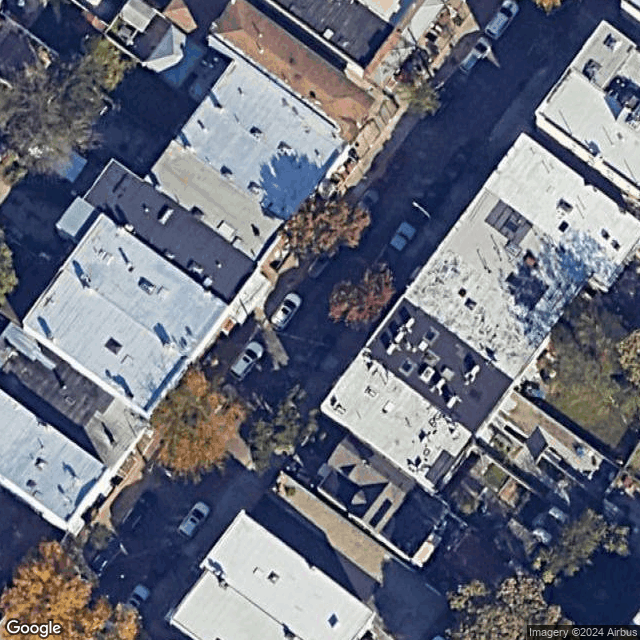

Distance: 0.03 -- Result: False


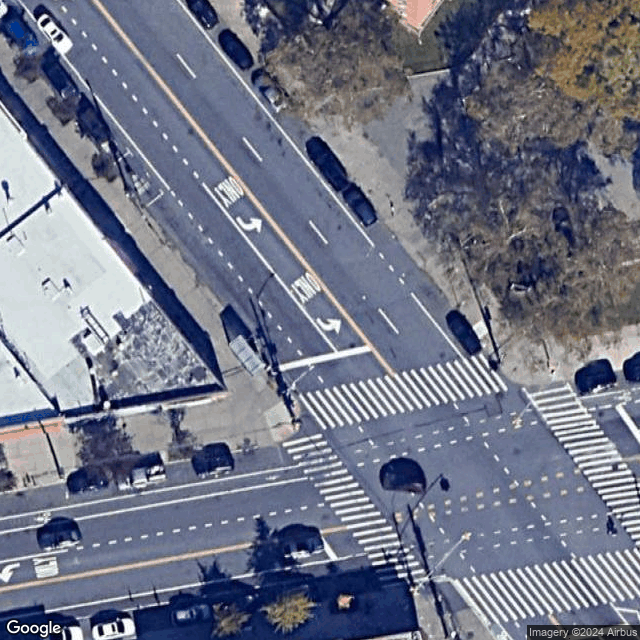

Distance: 0.05 -- Result: False


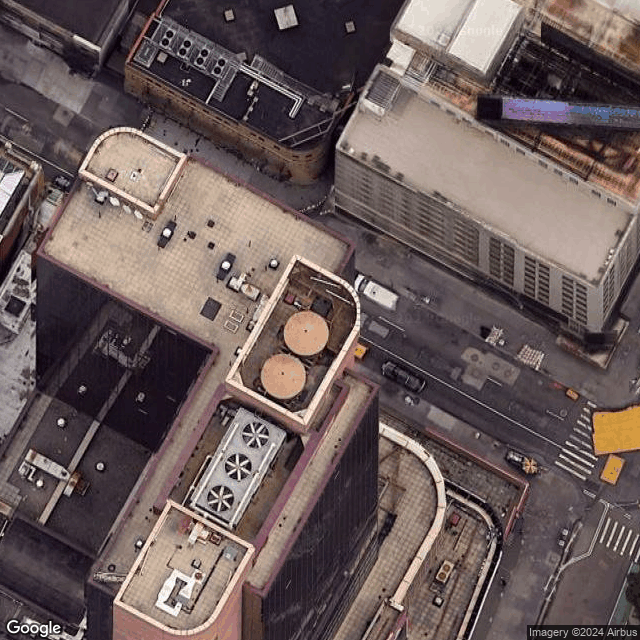

Distance: 0.07 -- Result: False


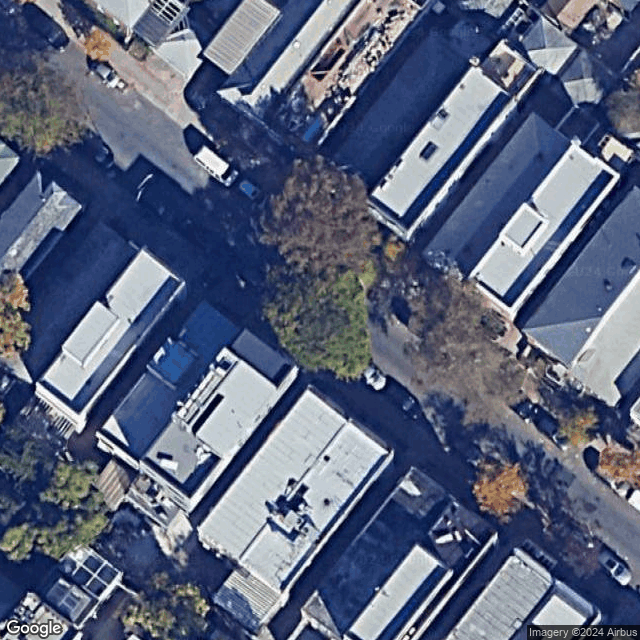

Distance: 0.03 -- Result: False


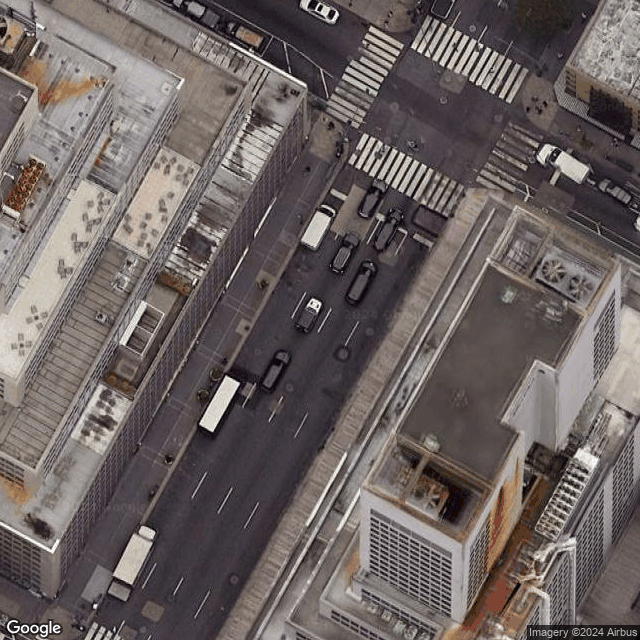

Distance: 0.15 -- Result: False


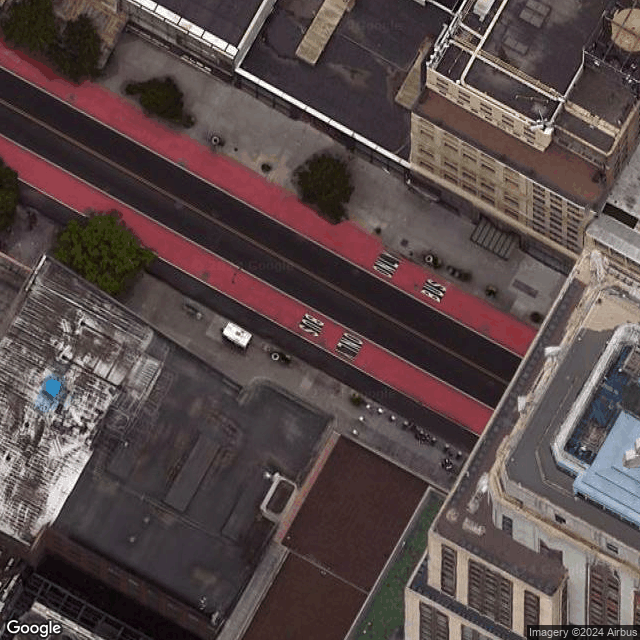

Distance: 0.03 -- Result: False


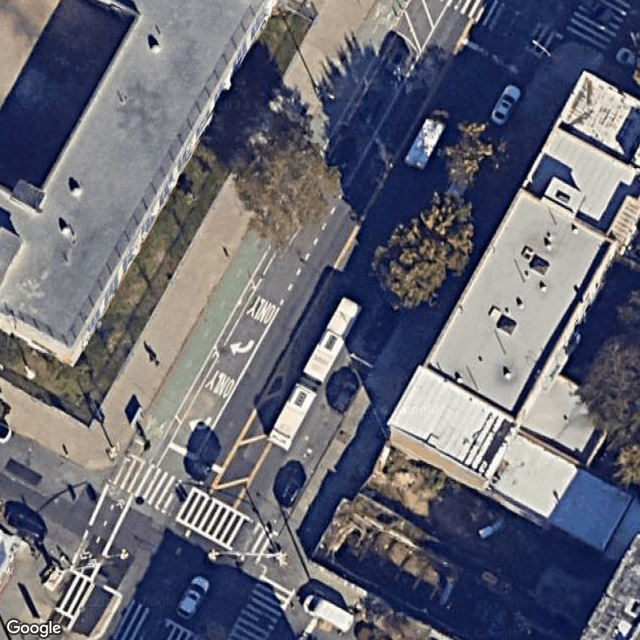

Distance: 0.1 -- Result: False


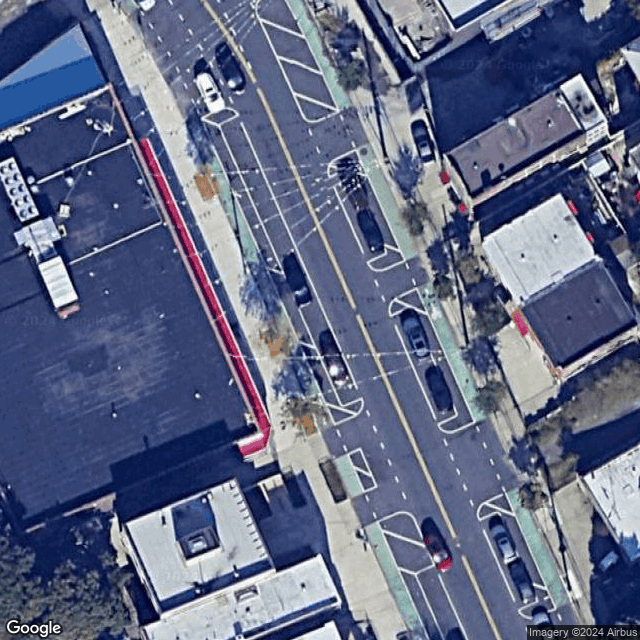

Distance: 0.03 -- Result: False


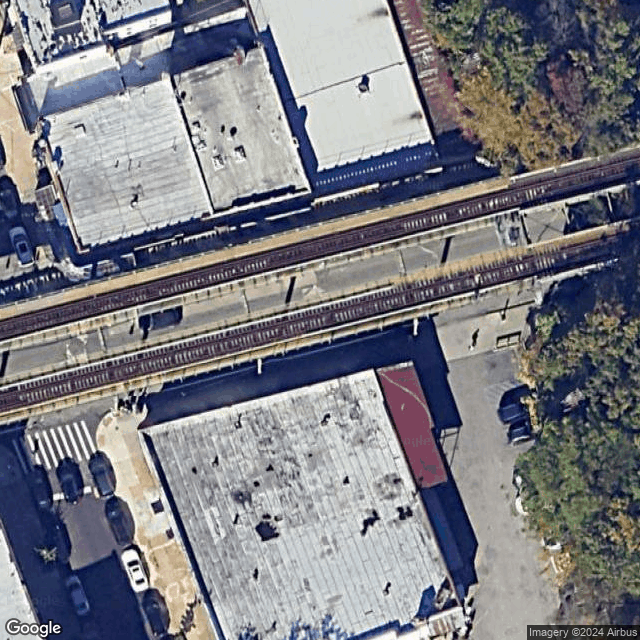

In [125]:
not_ints = int_flags[int_flags.intersection == False].reset_index(drop=True)

for i, record in not_ints.iterrows():
    coords = (record.lat, record.lng)
    lat, lng, result, data = check_for_intersection(coords)
    if data:
        print(f'Distance: {data["distance"]} -- Result: {result}')
    img = get_satellite_image(record.lat, record.lng)
    display(img)